In [1]:
import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.keras import backend as K
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from patchify import patchify, unpatchify
from tensorflow.keras import backend as K
from skimage.measure import label

def f1(y_true, y_pred, threshold=0.3):
    y_pred = tf.cast(y_pred > threshold, tf.float32)
    TP = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true * y_pred, 0, 1)))
    Positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true, 0, 1)))
    Pred_Positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_pred, 0, 1)))
    precision = TP / (Pred_Positives + tf.keras.backend.epsilon())
    recall = TP / (Positives + tf.keras.backend.epsilon())
    return 2 * ((precision * recall) / (precision + recall + tf.keras.backend.epsilon()))
    
@tf.keras.utils.register_keras_serializable()
def f1_metric(y_true, y_pred):
    return f1(y_true, y_pred, threshold=0.3)


def weighted_binary_crossentropy(y_true, y_pred):
    """
    Weighted binary cross-entropy to address class imbalance.
    """
    # Define weights for foreground (root, shoot, seed) and background
    weight_foreground = 10.0
    weight_background = 1.0

    # Compute weighted binary cross-entropy
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    weights = tf.where(y_true == 1, weight_foreground, weight_background)
    loss = K.binary_crossentropy(y_true, y_pred)
    weighted_loss = loss * weights
    return K.mean(weighted_loss)
def dice_loss(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice = (2. * intersection + 1e-7) / (union + 1e-7)
    return 1 - dice

@tf.keras.utils.register_keras_serializable()
def combined_loss(y_true, y_pred):
    return 0.5 * dice_loss(y_true, y_pred) + 0.5 * weighted_binary_crossentropy(y_true, y_pred)





2025-01-01 21:05:57.283510: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-01 21:05:57.283560: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-01 21:05:57.285130: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-01 21:05:57.292560: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
INFO: generated new fontManager


INFO: Processing image: test_image_1.png
INFO: Components filtered by top region: 1


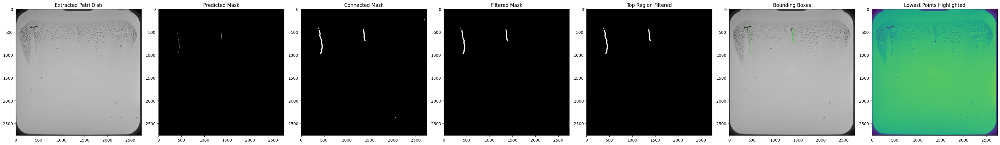

INFO: Processing image: test_image_10.png
INFO: Components filtered by top region: 1


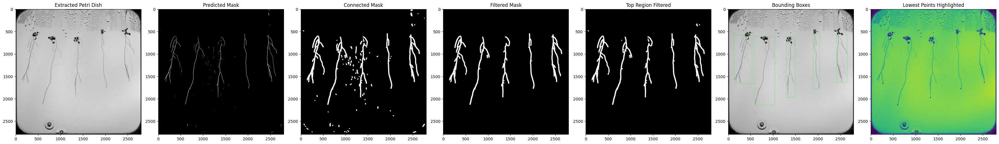

INFO: Processing image: test_image_11.png
INFO: Components filtered by top region: 1


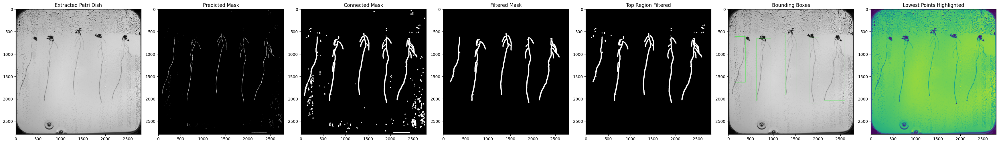

INFO: Processing image: test_image_12.png
INFO: Components filtered by top region: 1


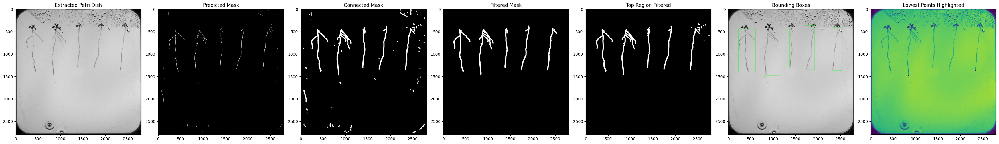

INFO: Processing image: test_image_13.png
INFO: Components filtered by top region: 1


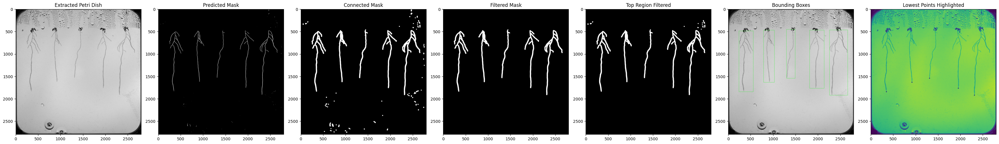

INFO: Processing image: test_image_14.png
INFO: Components filtered by top region: 1


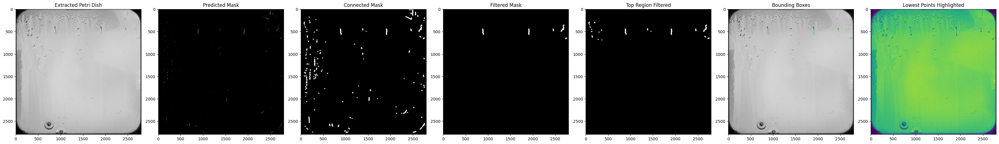

INFO: Processing image: test_image_15.png
INFO: Components filtered by top region: 1


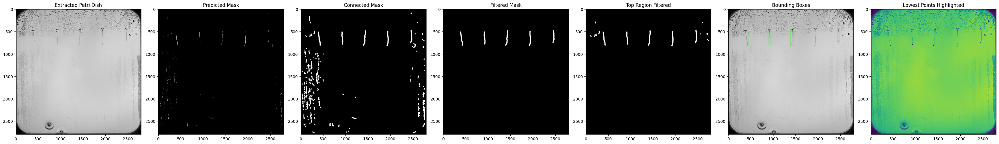

INFO: Processing image: test_image_16.png
INFO: Components filtered by top region: 1


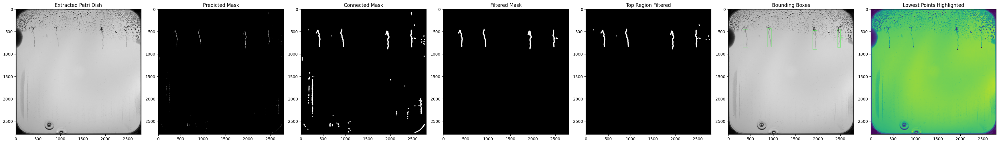

INFO: Processing image: test_image_17.png
INFO: Components filtered by top region: 1


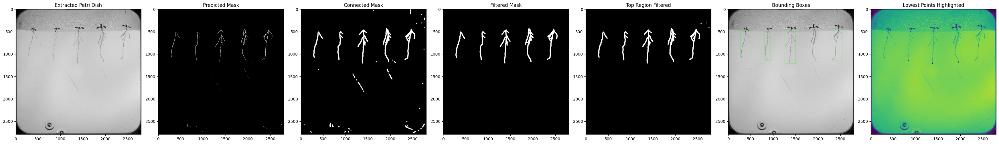

INFO: Processing image: test_image_18.png
INFO: Components filtered by top region: 1


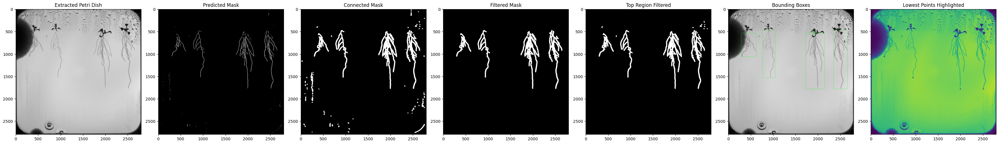

INFO: Processing image: test_image_2.png
INFO: Components filtered by top region: 1


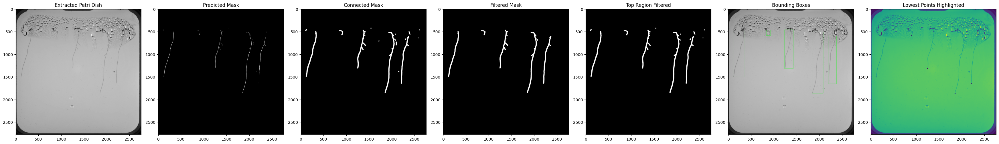

INFO: Processing image: test_image_3.png
INFO: Components filtered by top region: 1


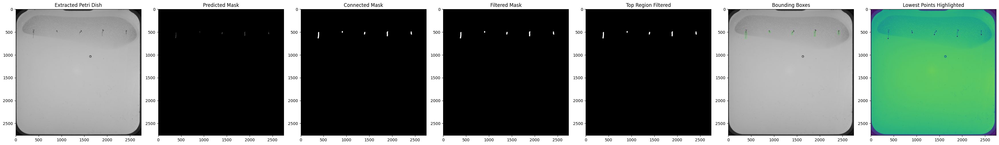

INFO: Processing image: test_image_4.png
INFO: Components filtered by top region: 1


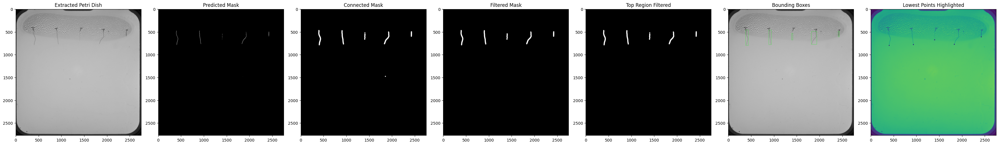

INFO: Processing image: test_image_5.png
INFO: Components filtered by top region: 1


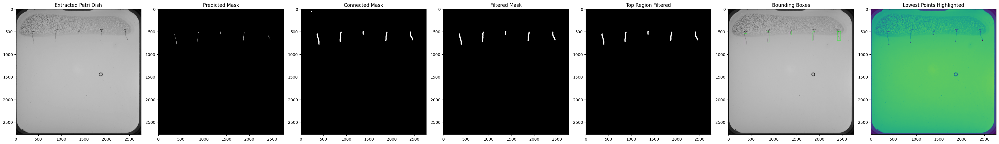

INFO: Processing image: test_image_6.png
INFO: Components filtered by top region: 1


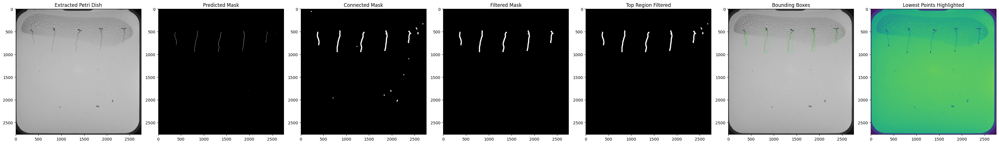

INFO: Processing image: test_image_7.png
INFO: Components filtered by top region: 1


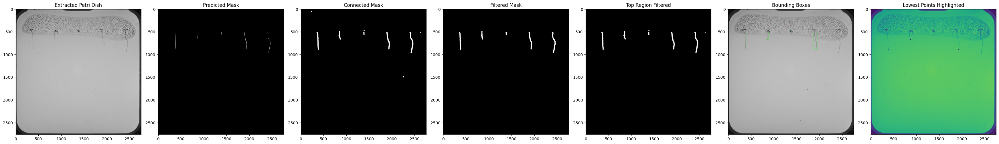

INFO: Processing image: test_image_8.png
INFO: Components filtered by top region: 1


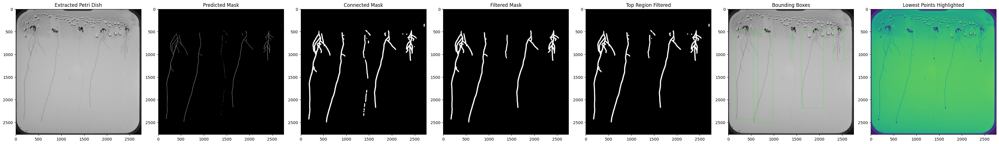

INFO: Processing image: test_image_9.png
INFO: Components filtered by top region: 1


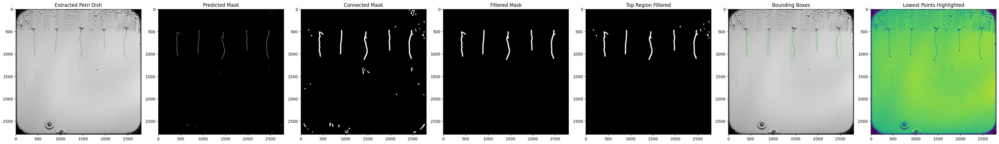

In [13]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import logging

# Configure logging
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s - %(levelname)s - %(message)s",
    handlers=[
        logging.FileHandler("pipeline_log.txt"),
        logging.StreamHandler()
    ]
)

def preprocess_image(image_path):
    """Load and preprocess the input image."""
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError(f"Failed to load image: {image_path}")
    return image

def extract_petri_dish(image):
    """Extract the largest contour assumed to be the Petri dish."""
    _, thresholded = cv2.threshold(image, 57, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        logging.warning("No contours detected for Petri dish.")
        return image, np.ones_like(image)

    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    mask = np.zeros_like(image)
    cv2.drawContours(mask, [largest_contour], -1, 255, -1)
    cropped_image = image[y:y+h, x:x+w]
    return cropped_image, mask[y:y+h, x:x+w]

def predict_root_mask(image, model, patch_size=128, stride=64):
    """Predict root mask using a patch-based model."""
    h, w = image.shape
    patches = []
    positions = []
    for y in range(0, h - patch_size + 1, stride):
        for x in range(0, w - patch_size + 1, stride):
            patch = image[y:y+patch_size, x:x+patch_size]
            patch_rgb = np.stack([patch]*3, axis=-1)
            patches.append(patch_rgb)
            positions.append((y, x))

    patches = np.array(patches) / 255.0
    predictions = model.predict(patches, verbose=0)

    reconstructed = np.zeros((h, w), dtype=np.float32)
    counts = np.zeros((h, w), dtype=np.float32)
    for pred, (y, x) in zip(predictions, positions):
        pred = pred[..., 0]
        reconstructed[y:y+patch_size, x:x+patch_size] += pred
        counts[y:y+patch_size, x:x+patch_size] += 1
    return (reconstructed / np.maximum(counts, 1) > 0.5).astype(np.uint8)

def connect_roots(mask):
    """Dilate the mask to connect fragmented roots."""
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    return cv2.dilate(mask, kernel, iterations=5)

def filter_and_select_largest_objects(mask, min_area=300, max_objects=5):
    """Filter and retain the largest root components."""
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    valid_objects = [(i, stats[i, cv2.CC_STAT_AREA]) for i in range(1, num_labels) if stats[i, cv2.CC_STAT_AREA] >= min_area]
    largest_objects = sorted(valid_objects, key=lambda x: x[1], reverse=True)[:max_objects]

    filtered_mask = np.zeros_like(mask, dtype=np.uint8)
    for obj_id, _ in largest_objects:
        filtered_mask[labels == obj_id] = 255
    return filtered_mask, largest_objects

def filter_by_top_region(mask, start_fraction=0.1, end_fraction=0.25):
    """Filter components that do not intersect with the specified top region."""
    h, w = mask.shape
    top_region = np.zeros_like(mask, dtype=np.uint8)
    top_start = int(h * start_fraction)
    top_end = int(h * end_fraction)
    top_region[top_start:top_end, :] = 255  # Define the valid top region

    num_labels, labels, _, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)

    filtered_mask = np.zeros_like(mask, dtype=np.uint8)
    for i in range(1, num_labels):  # Skip background
        component = (labels == i).astype(np.uint8)
        intersection = cv2.bitwise_and(component, top_region)
        if np.any(intersection):  # Keep component if it intersects with top region
            filtered_mask[component > 0] = 255

    logging.info(f"Components filtered by top region: {np.unique(filtered_mask).shape[0] - 1}")
    return filtered_mask

def measure_bounding_boxes(filtered_mask):
    """Measure roots with bounding boxes."""
    contours, _ = cv2.findContours(filtered_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    bounding_boxes = [cv2.boundingRect(contour) for contour in contours]
    bounding_boxes = sorted(bounding_boxes, key=lambda b: b[0])  # Sort left-to-right
    return bounding_boxes

def find_lowest_point(mask, bounding_box):
    """Find the lowest point of the root inside the bounding box."""
    x, y, w, h = bounding_box
    roi = mask[y:y+h, x:x+w]  # Extract the region of interest (ROI)
    coordinates = np.column_stack(np.where(roi > 0))  # Get all root pixel coordinates in ROI

    if len(coordinates) == 0:
        return None  # No root pixels found in the bounding box

    # Find the pixel with the maximum y-coordinate (lowest point)
    lowest_local = coordinates[np.argmax(coordinates[:, 0])]
    lowest_global = (lowest_local[0] + y, lowest_local[1] + x)  # Map back to global coordinates
    return lowest_global

def find_lowest_point(mask, bounding_box):
    """
    Identify the lowest point of the root inside the bounding box.
    The lowest point is the pixel closest to the bottom edge of the bounding box.
    """
    x, y, w, h = bounding_box
    roi = mask[y:y+h, x:x+w]  # Extract the region of interest (ROI) based on the bounding box
    coordinates = np.column_stack(np.where(roi > 0))  # Get all root pixel coordinates in ROI

    if len(coordinates) == 0:
        return None  # No root pixels found in the bounding box

    # Find the pixel with the maximum y-coordinate (lowest point in the bounding box)
    lowest_local = coordinates[np.argmax(coordinates[:, 0])]
    lowest_global = (lowest_local[0] + y, lowest_local[1] + x)  # Map back to global coordinates
    return lowest_global

def highlight_lowest_points(image, filtered_mask, bounding_boxes, circle_radius=10):
    """
    Highlight the lowest points of the primary roots on the image as small circles.
    """
    for box in bounding_boxes:
        lowest_point = find_lowest_point(filtered_mask, box)
        if lowest_point:
            # Draw a red circle at the lowest point
            cv2.circle(image, (lowest_point[1], lowest_point[0]), radius=circle_radius, color=(0, 0, 255), thickness=-1)
    return image

# Example Visualization Integration
def visualize_pipeline_steps(petri_dish, predicted, connected, filtered, top_filtered, bounding_boxes, highlighted_image):
    """Visualize the steps of the pipeline."""
    fig, axes = plt.subplots(1, 7, figsize=(35, 6))
    axes[0].imshow(petri_dish, cmap="gray")
    axes[0].set_title("Extracted Petri Dish")
    axes[1].imshow(predicted, cmap="gray")
    axes[1].set_title("Predicted Mask")
    axes[2].imshow(connected, cmap="gray")
    axes[2].set_title("Connected Mask")
    axes[3].imshow(filtered, cmap="gray")
    axes[3].set_title("Filtered Mask")
    axes[4].imshow(top_filtered, cmap="gray")
    axes[4].set_title("Top Region Filtered")
    boxed_image = cv2.cvtColor(petri_dish, cv2.COLOR_GRAY2BGR)
    for (x, y, w, h) in bounding_boxes:
        cv2.rectangle(boxed_image, (x, y), (x+w, y+h), (0, 255, 0), 2)
    axes[5].imshow(boxed_image)
    axes[5].set_title("Bounding Boxes")
    axes[6].imshow(highlighted_image)
    axes[6].set_title("Lowest Points Highlighted")
    plt.tight_layout()
    plt.show()

# Update full pipeline to include circle-based highlighting
def full_pipeline(input_dir, model_path, output_csv):
    """Run the full pipeline."""
    model = tf.keras.models.load_model(model_path)
    results = []

    for image_name in sorted(os.listdir(input_dir)):
        if not image_name.endswith(".png"):
            continue

        logging.info(f"Processing image: {image_name}")
        image_path = os.path.join(input_dir, image_name)
        image = preprocess_image(image_path)
        petri_dish, _ = extract_petri_dish(image)
        predicted_mask = predict_root_mask(petri_dish, model)
        connected_mask = connect_roots(predicted_mask)
        top_filtered_mask = filter_by_top_region(connected_mask, start_fraction=0.1, end_fraction=0.25)
        filtered_mask, _ = filter_and_select_largest_objects(top_filtered_mask)
        bounding_boxes = measure_bounding_boxes(filtered_mask)
        highlighted_image = highlight_lowest_points(petri_dish.copy(), filtered_mask, bounding_boxes, circle_radius=10)
        visualize_pipeline_steps(petri_dish, predicted_mask, connected_mask, filtered_mask, top_filtered_mask, bounding_boxes, highlighted_image)

# Run the corrected pipeline
full_pipeline(input_dir="local_client_data/kaggle_test",
              model_path="232430_unet_model_128px_v7md.keras",
              output_csv="final_root_measurements_with_circle_highlighting.csv")


